# Image Colorization

In this python notebook, I will create a convolutional model for colorizing a grayscale image.

In [1]:
# importing required libraries

## for some reasons i am having problems in some functions of opencv and some funtions of skimage.
## thankfully problems in both libraries are different, so i am using both of them to satisfy my needs.
import os
import tensorflow as tf
import keras
import keras.layers as l
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras import backend as K
import skimage
import skimage.color as color

Using TensorFlow backend.


In [ ]:
mydir = r'Train/'
files = [os.path.join(mydir, f) for f in os.listdir(mydir)]
len(files)

In [ ]:
X = []
i = 0
for image in files:
    i += 1
    if i > 100: break
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = color.rgb2lab(1.0/255*img)
    #img = color.rgb2lab(1.0/255*img)
    X.append(img)
X = np.array(X, dtype = float)

In [ ]:
#split = int(0.95*len(X))
Xtrain = X[:10]
xt = Xtrain[:,:,:,0]
yt = Xtrain[:,:,:,1:]
yt = yt/128
xt.shape

In [ ]:
xt = xt.reshape(10, 256, 256, 1)
yt = yt.reshape(10, 256, 256, 2)

In [2]:
model = keras.models.Sequential()
model.add(l.InputLayer(input_shape=(256, 256, 1)))
model.add(l.Conv2D(8, (3, 3), activation='relu', padding = 'same', strides = 2))
model.add(l.Conv2D(8, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(8, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(16, (3, 3), activation = 'relu', padding='same', strides = 2))
model.add(l.Conv2D(16, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(16, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(32, (3, 3), activation = 'relu', padding='same', strides = 2))
model.add(l.Conv2D(32, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(32, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(64, (3, 3), activation = 'relu', padding='same', strides = 2))
model.add(l.Conv2D(64, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(64, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(128, (3, 3), activation = 'relu', padding='same', strides = 2))
model.add(l.Conv2D(128, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(128, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(256, (3, 3), activation = 'relu', padding='same', strides = 2))
model.add(l.Conv2D(256, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(256, (3, 3), activation = 'relu', padding='same'))
model.add(l.UpSampling2D((2, 2)))
model.add(l.Conv2D(256, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(256, (3, 3), activation = 'relu', padding='same'))
model.add(l.UpSampling2D((2, 2)))
#model.add(l.Conv2D(128, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(128, (3, 3), activation = 'relu', padding='same'))
model.add(l.UpSampling2D((2, 2)))
#model.add(l.Conv2D(64, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(64, (3, 3), activation = 'relu', padding='same'))
#model.add(l.Conv2D(64, (3, 3), activation = 'relu', padding='same'))
model.add(l.UpSampling2D((2, 2)))
#model.add(l.Conv2D(32, (3, 3), activation = 'relu', padding='same'))
#model.add(l.Conv2D(32, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(32, (3, 3), activation = 'relu', padding='same'))
model.add(l.UpSampling2D((2, 2)))
#model.add(l.Conv2D(16, (3, 3), activation = 'relu', padding='same'))
#model.add(l.Conv2D(16, (3, 3), activation = 'relu', padding='same'))
model.add(l.Conv2D(16, (3, 3), activation = 'relu', padding='same'))
model.add(l.UpSampling2D((2, 2)))
model.add(l.Conv2D(2, (3, 3), activation = 'tanh', padding='same'))

model.compile(optimizer = 'rmsprop', loss = 'mse')
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 256, 256, 1)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 8)       80        
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 128, 128, 8)       584       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 128, 128, 8)       584       
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 64, 64, 16)        1168      
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 64, 64, 16)        2320      
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 64, 64, 16)        2320      
__________

In [ ]:
model.fit(x = xt, y = yt, epochs = 400, lr = 0.001)

In [10]:
model = keras.models.load_model("2000_130.h5")

In [ ]:
model.summary()

In [12]:
tst = r'Test/'
tfiles = [os.path.join(tst, f) for f in os.listdir(tst)]
len(tfiles)

109

grayscale image


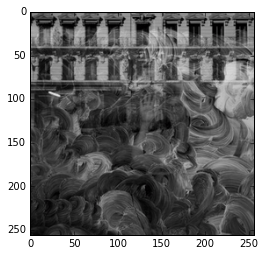

colorized image


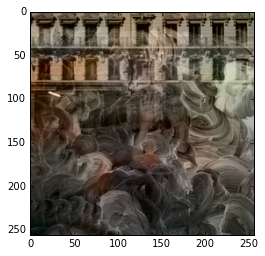

grayscale image


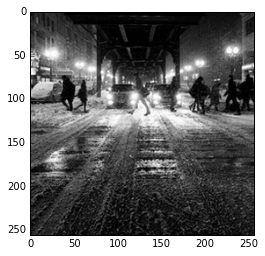

colorized image


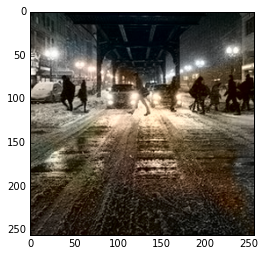

grayscale image


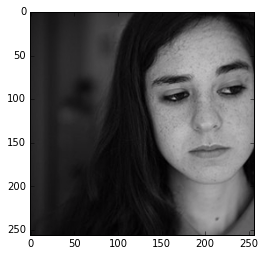

colorized image


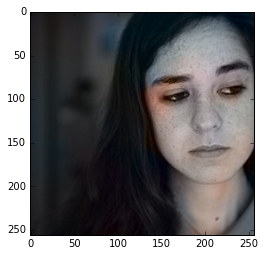

grayscale image


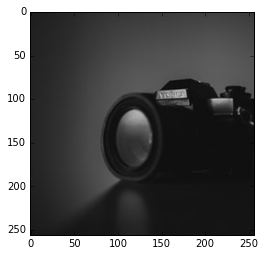

colorized image


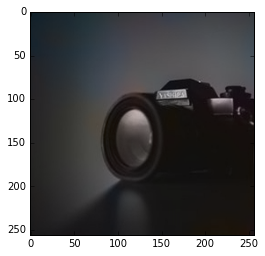

grayscale image


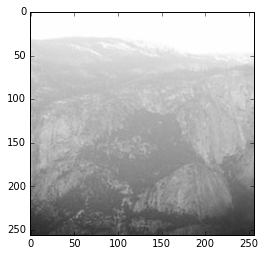

colorized image


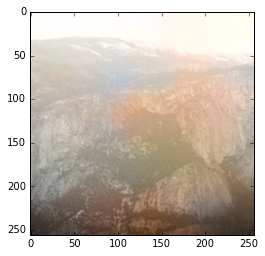

grayscale image


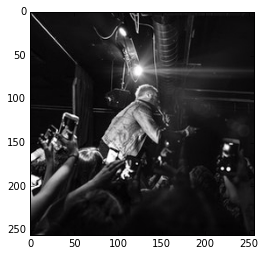

colorized image


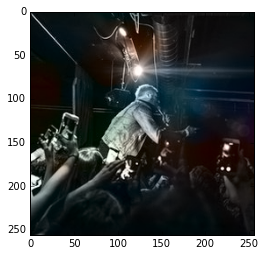

grayscale image


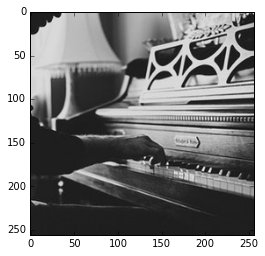

colorized image


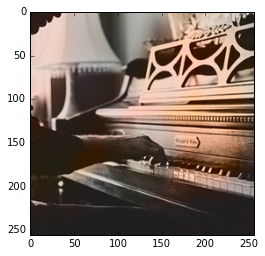

grayscale image


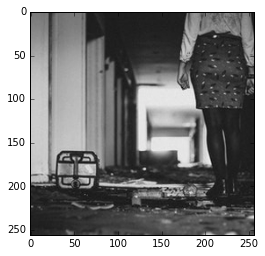

colorized image


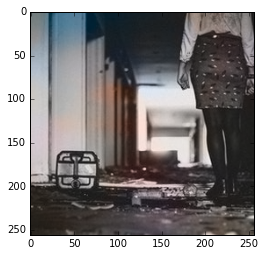

grayscale image


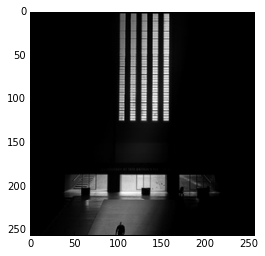

colorized image


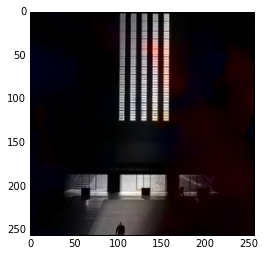

grayscale image


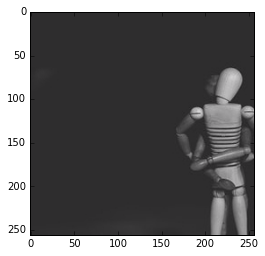

colorized image


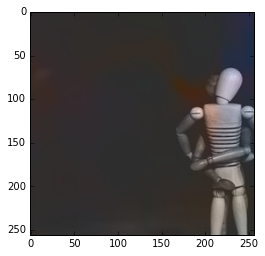

grayscale image


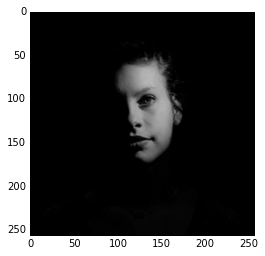

colorized image


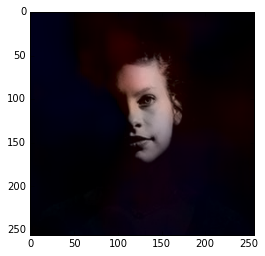

grayscale image


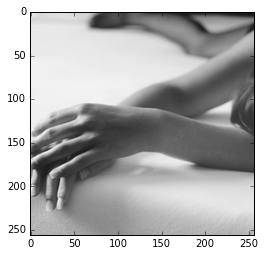

colorized image


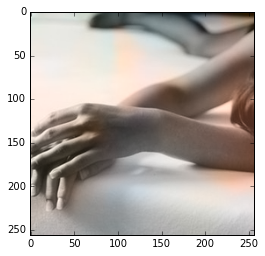

grayscale image


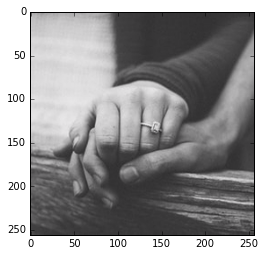

colorized image


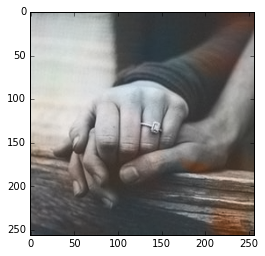

grayscale image


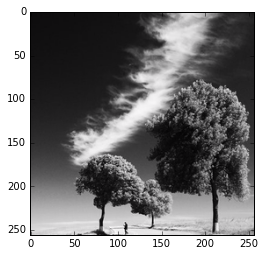

colorized image


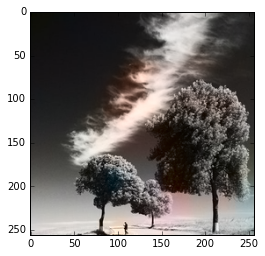

grayscale image


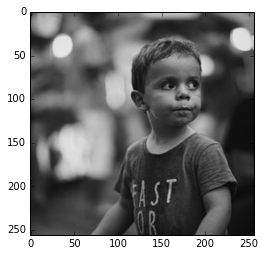

colorized image


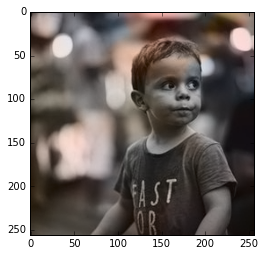

grayscale image


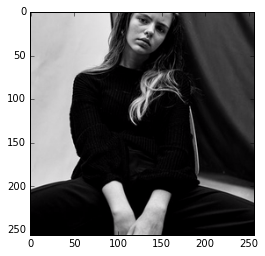

colorized image


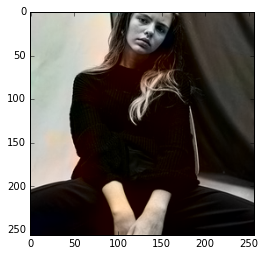

grayscale image


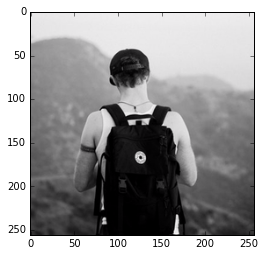

colorized image


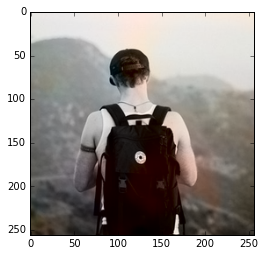

grayscale image


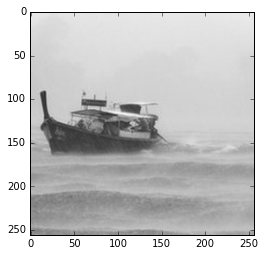

colorized image


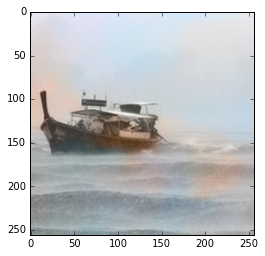

grayscale image


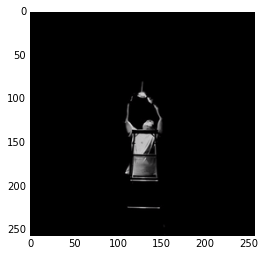

colorized image


C:\Users\hp\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\color\colorconv.py:985: UserWarning: Color data out of range: Z < 0 in 32 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


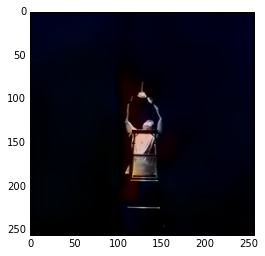

grayscale image


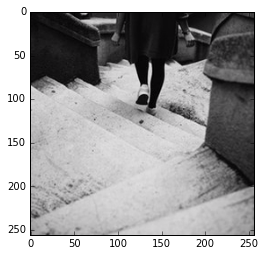

colorized image


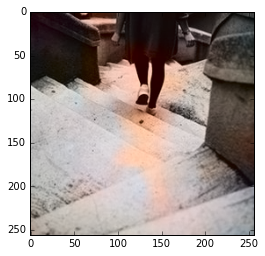

grayscale image


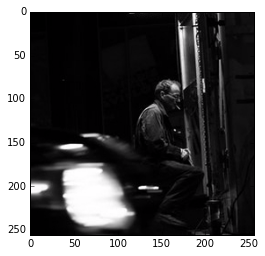

colorized image


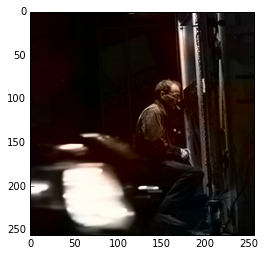

grayscale image


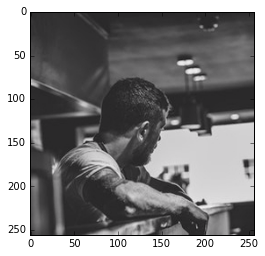

colorized image


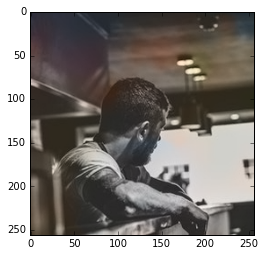

grayscale image


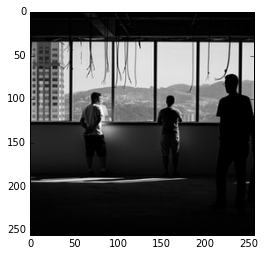

colorized image


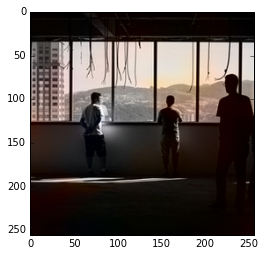

grayscale image


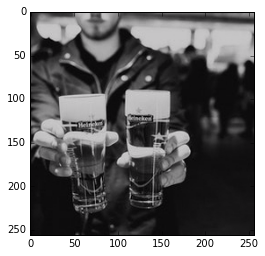

colorized image


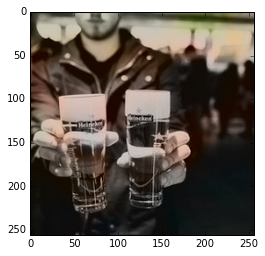

grayscale image


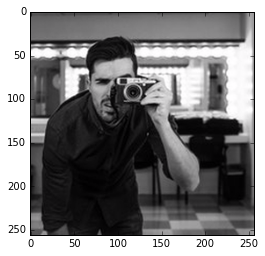

colorized image


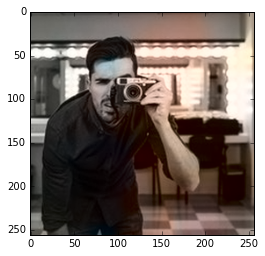

grayscale image


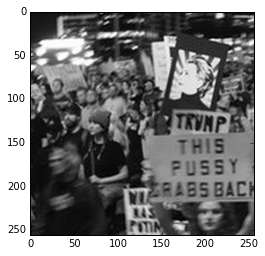

colorized image


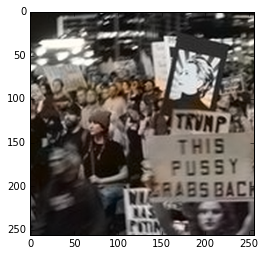

grayscale image


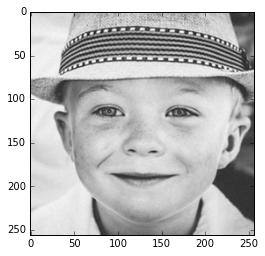

colorized image


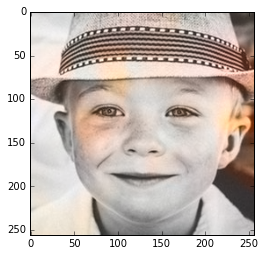

grayscale image


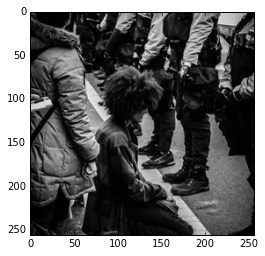

colorized image


C:\Users\hp\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\color\colorconv.py:985: UserWarning: Color data out of range: Z < 0 in 43 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


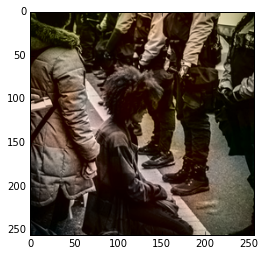

grayscale image


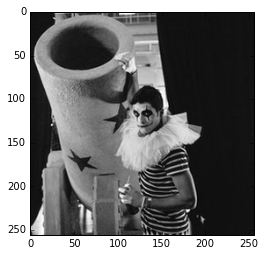

colorized image


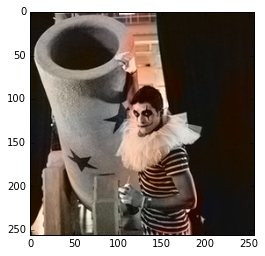

grayscale image


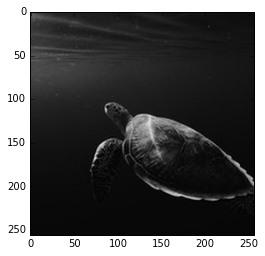

colorized image


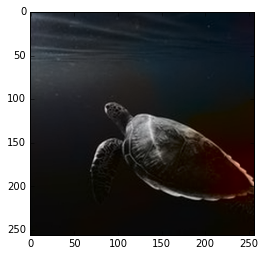

grayscale image


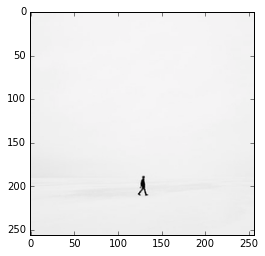

colorized image


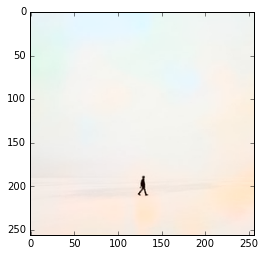

grayscale image


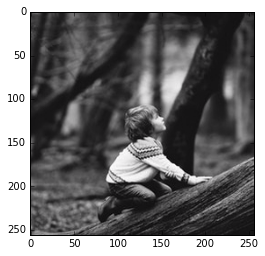

colorized image


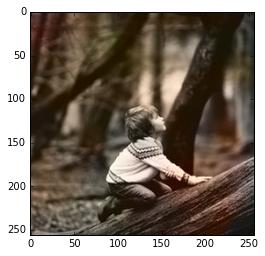

grayscale image


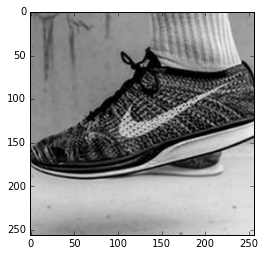

colorized image


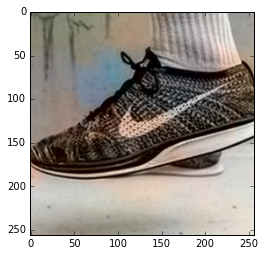

grayscale image


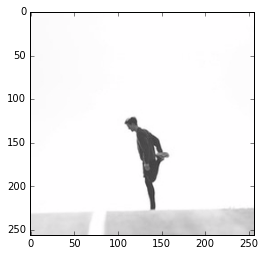

colorized image


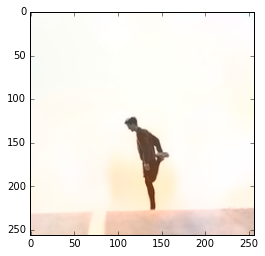

grayscale image


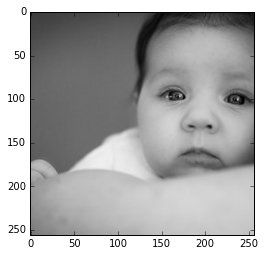

colorized image


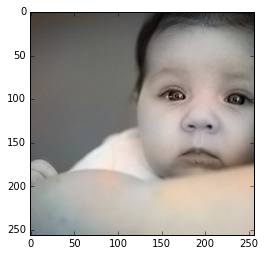

grayscale image


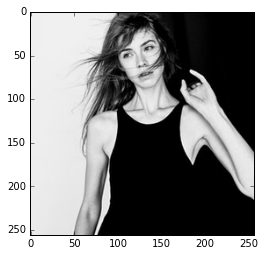

colorized image


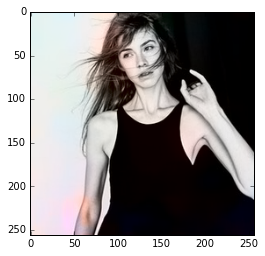

grayscale image


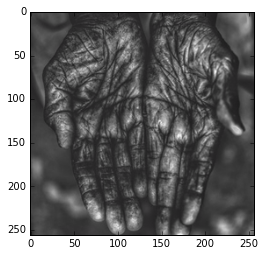

colorized image


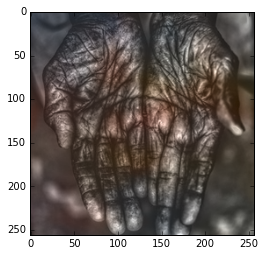

grayscale image


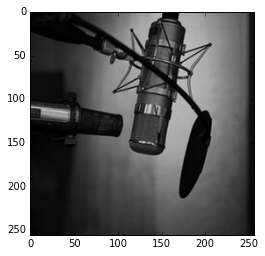

colorized image


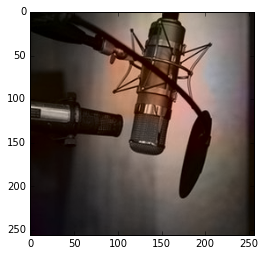

grayscale image


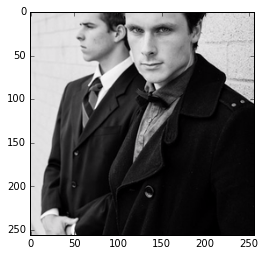

colorized image


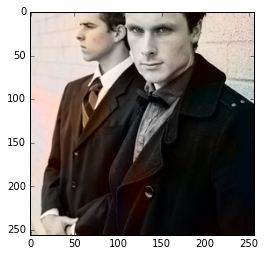

grayscale image


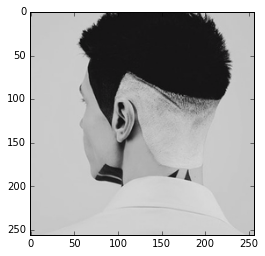

colorized image


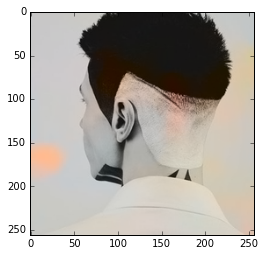

grayscale image


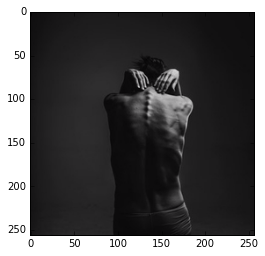

colorized image


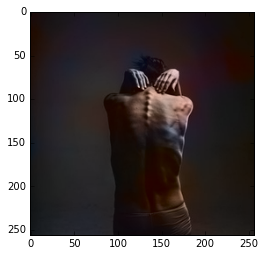

grayscale image


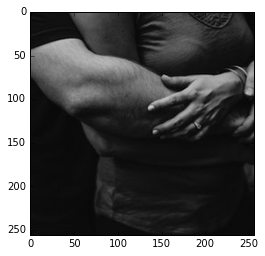

colorized image


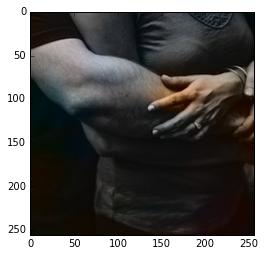

grayscale image


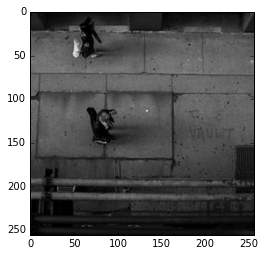

colorized image


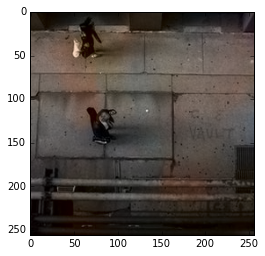

grayscale image


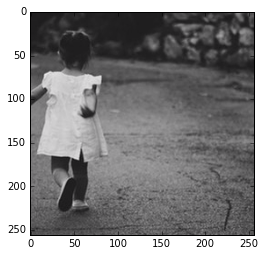

colorized image


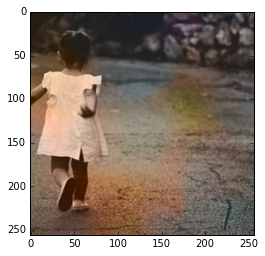

grayscale image


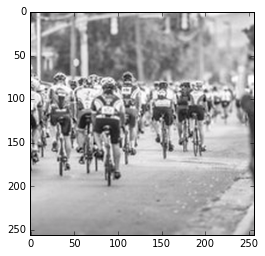

colorized image


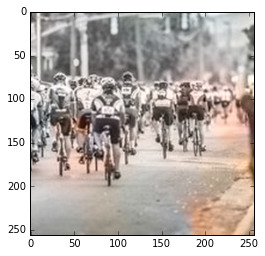

grayscale image


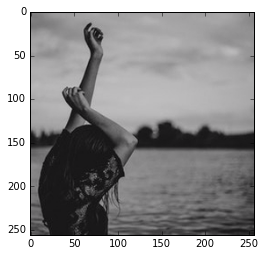

colorized image


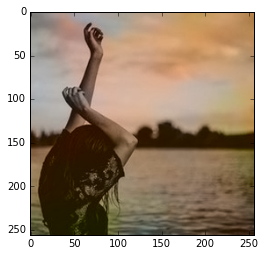

grayscale image


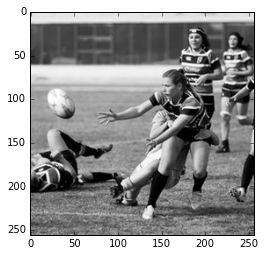

colorized image


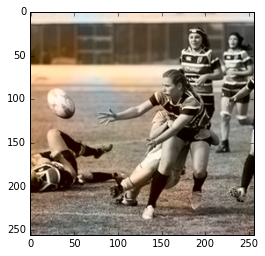

grayscale image


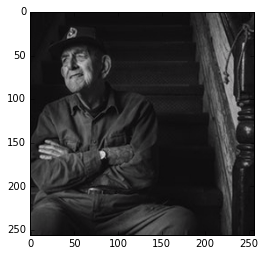

colorized image


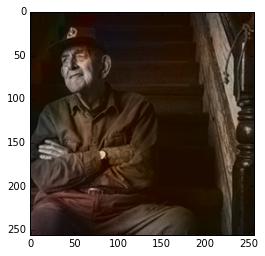

grayscale image


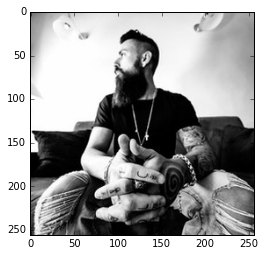

C:\Users\hp\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\color\colorconv.py:985: UserWarning: Color data out of range: Z < 0 in 6 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


colorized image


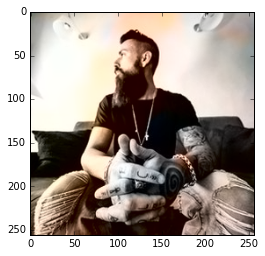

grayscale image


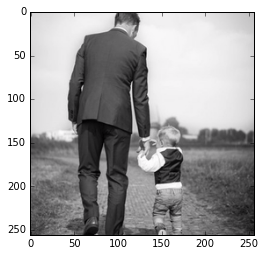

colorized image


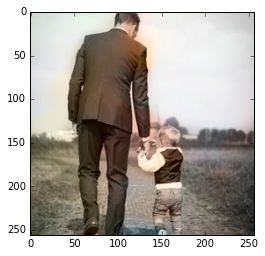

grayscale image


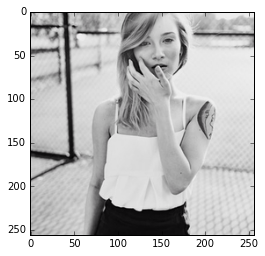

colorized image


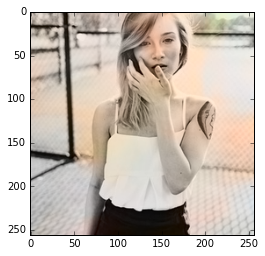

grayscale image


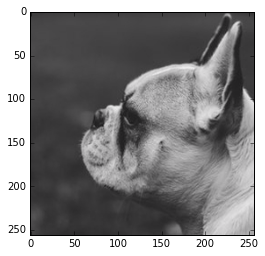

colorized image


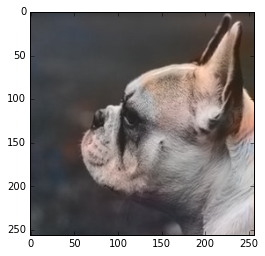

grayscale image


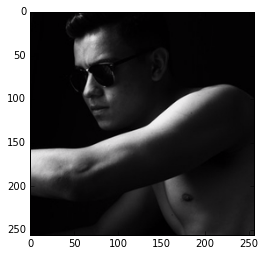

colorized image


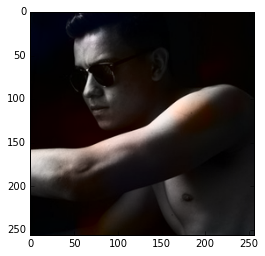

grayscale image


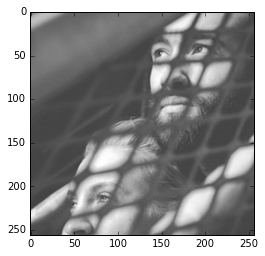

colorized image


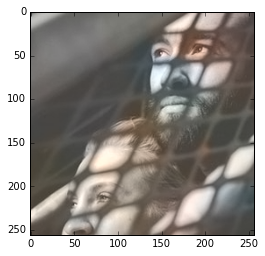

grayscale image


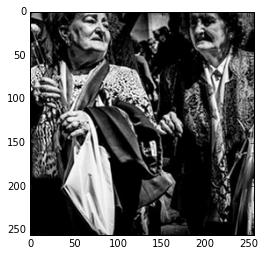

C:\Users\hp\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\color\colorconv.py:985: UserWarning: Color data out of range: Z < 0 in 16 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


colorized image


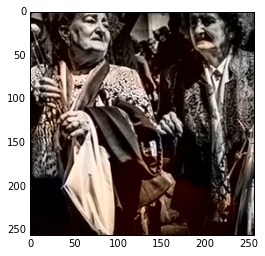

grayscale image


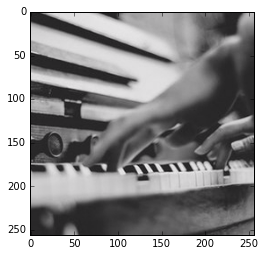

colorized image


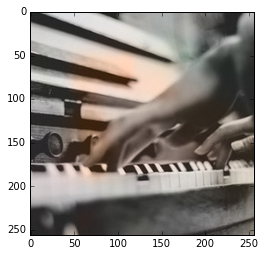

grayscale image


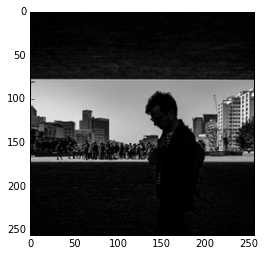

colorized image


C:\Users\hp\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\color\colorconv.py:985: UserWarning: Color data out of range: Z < 0 in 85 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


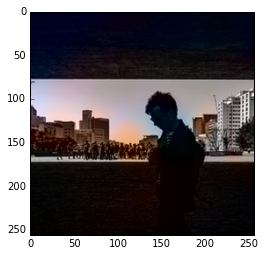

grayscale image


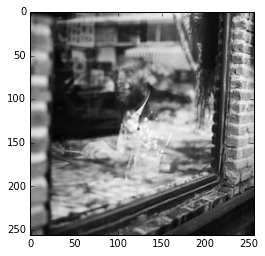

colorized image


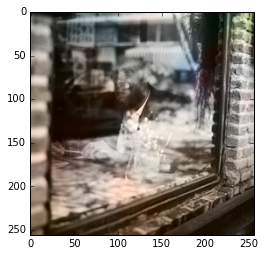

grayscale image


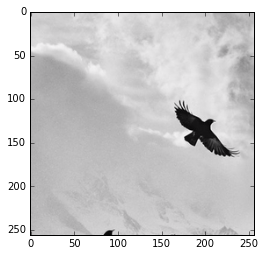

colorized image


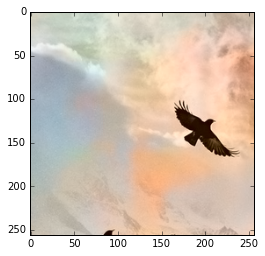

grayscale image


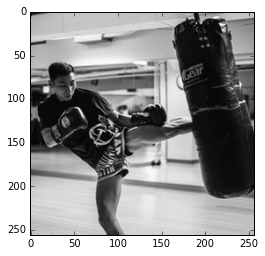

colorized image


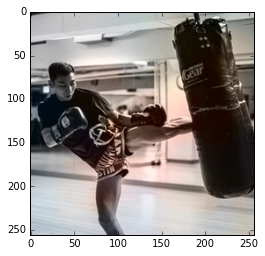

grayscale image


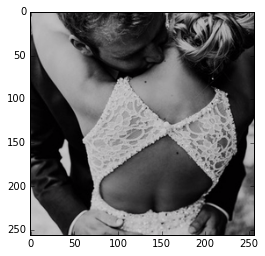

colorized image


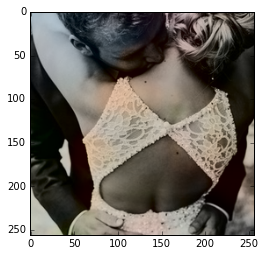

grayscale image


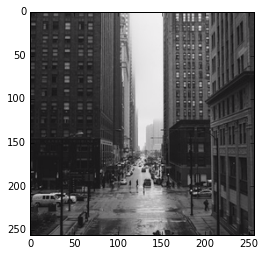

colorized image


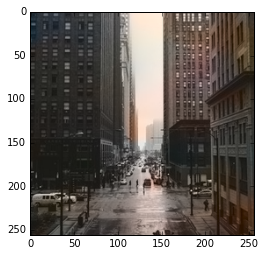

grayscale image


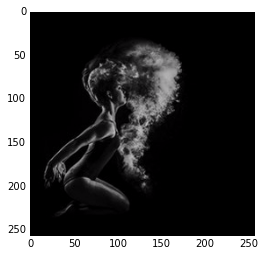

colorized image


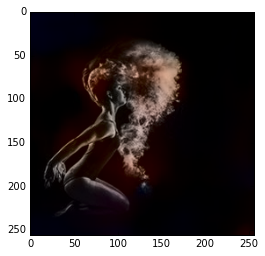

grayscale image


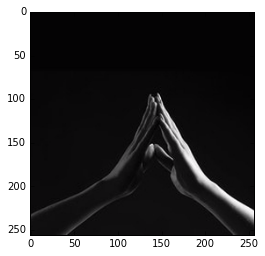

colorized image


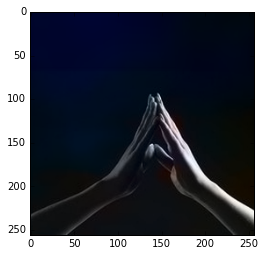

grayscale image


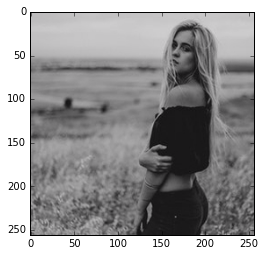

colorized image


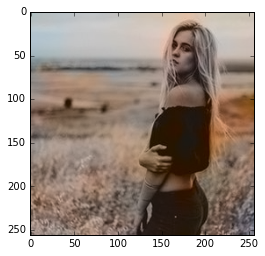

grayscale image


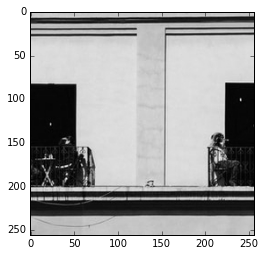

colorized image


C:\Users\hp\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\color\colorconv.py:985: UserWarning: Color data out of range: Z < 0 in 128 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


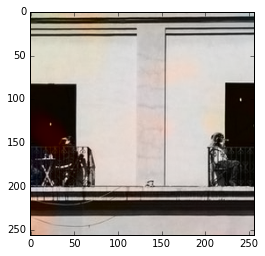

grayscale image


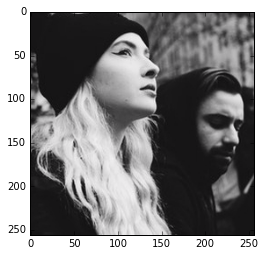

colorized image


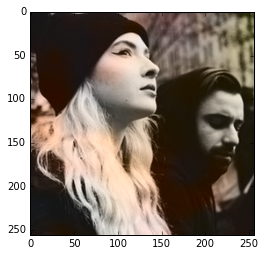

grayscale image


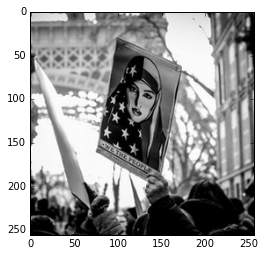

colorized image


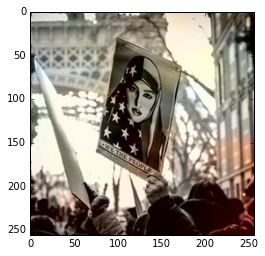

grayscale image


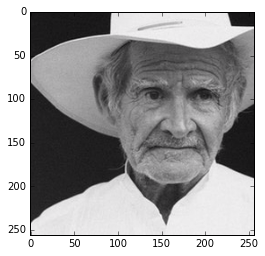

colorized image


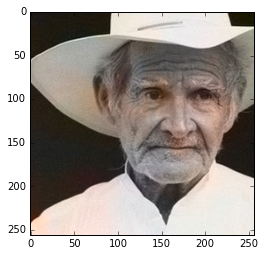

grayscale image


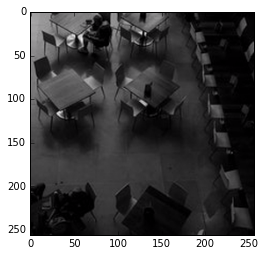

colorized image


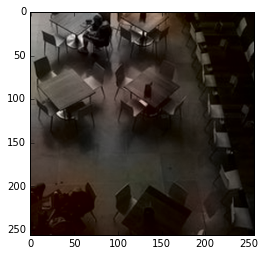

grayscale image


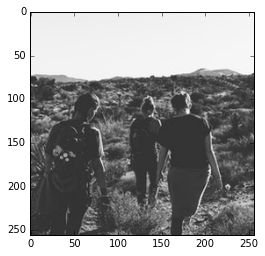

colorized image


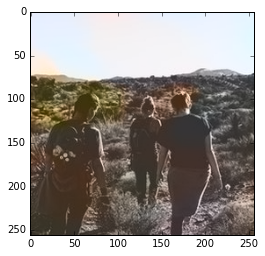

grayscale image


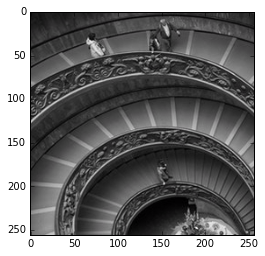

colorized image


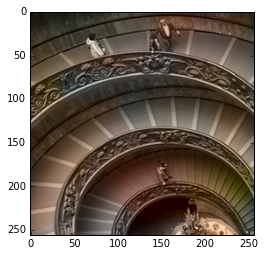

grayscale image


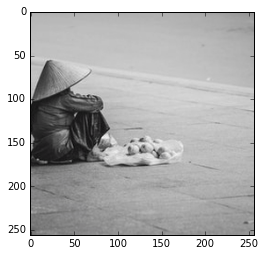

colorized image


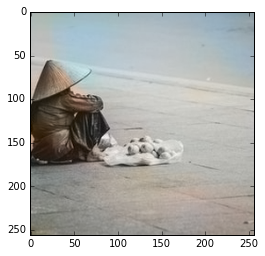

grayscale image


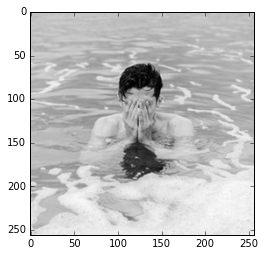

colorized image


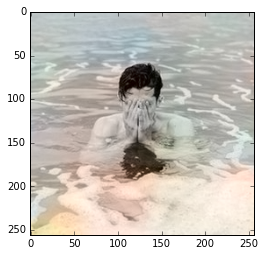

grayscale image


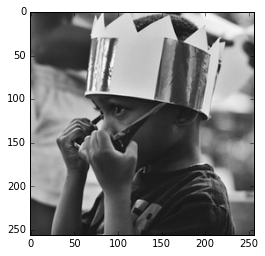

colorized image


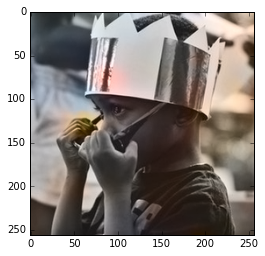

grayscale image


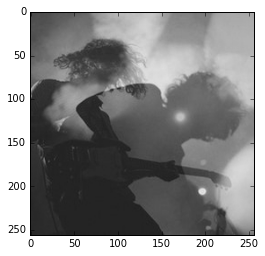

colorized image


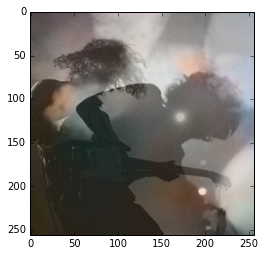

grayscale image


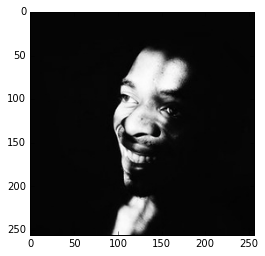

colorized image


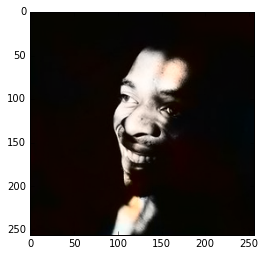

grayscale image


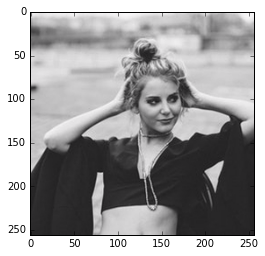

colorized image


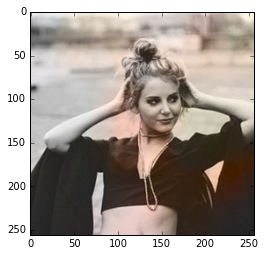

grayscale image


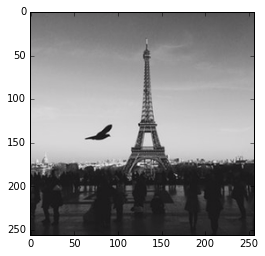

colorized image


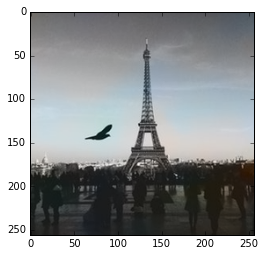

grayscale image


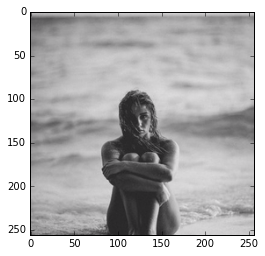

colorized image


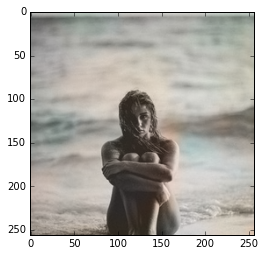

grayscale image


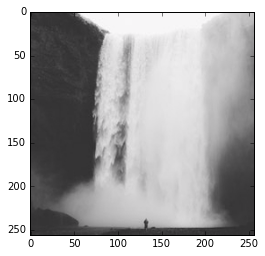

colorized image


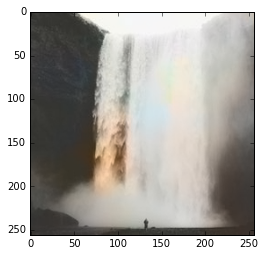

grayscale image


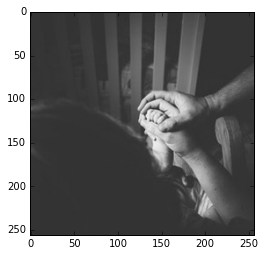

colorized image


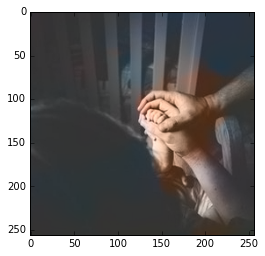

grayscale image


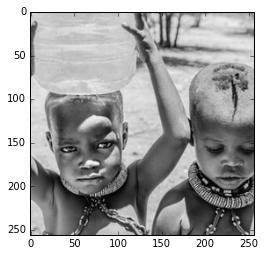

colorized image


C:\Users\hp\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\color\colorconv.py:985: UserWarning: Color data out of range: Z < 0 in 4 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


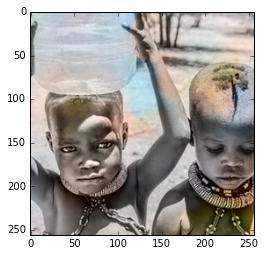

grayscale image


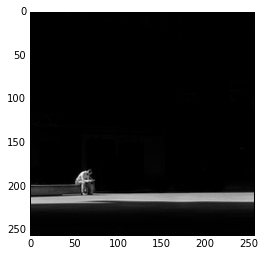

colorized image


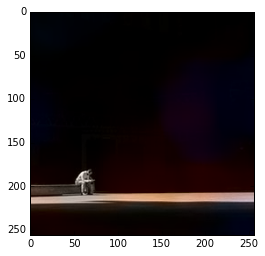

grayscale image


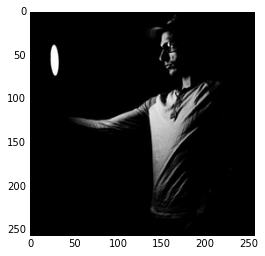

colorized image


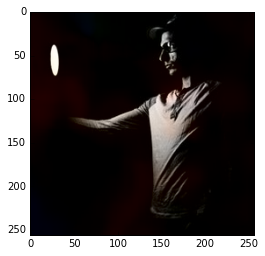

grayscale image


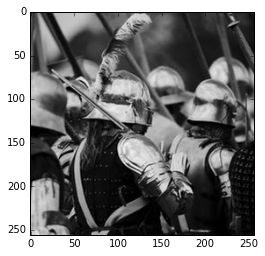

colorized image


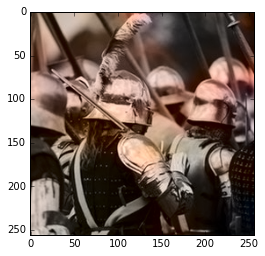

grayscale image


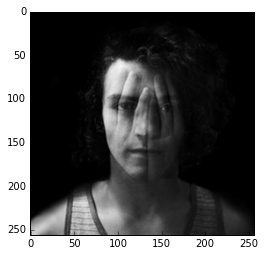

colorized image


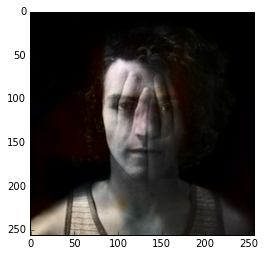

grayscale image


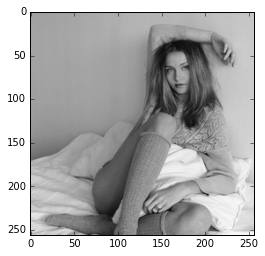

colorized image


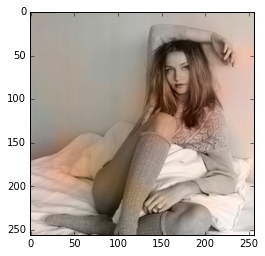

grayscale image


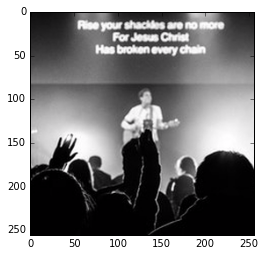

colorized image


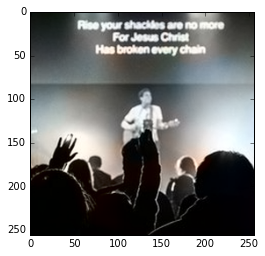

grayscale image


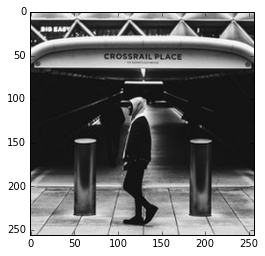

colorized image


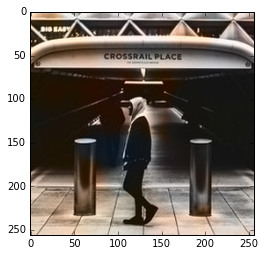

grayscale image


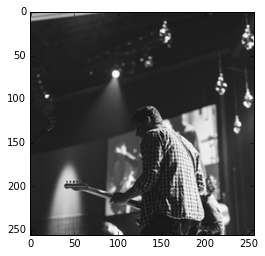

colorized image


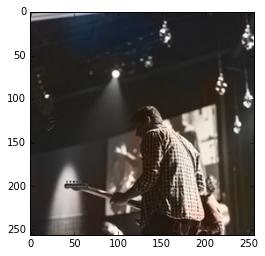

grayscale image


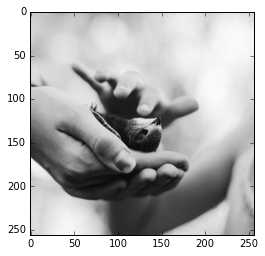

colorized image


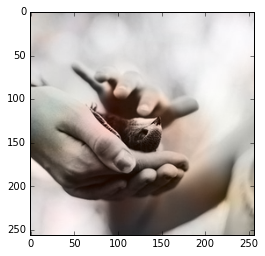

grayscale image


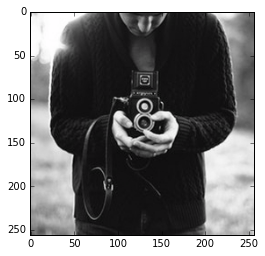

colorized image


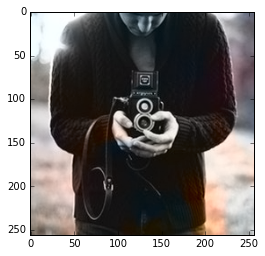

grayscale image


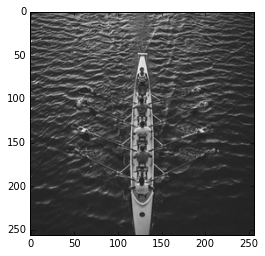

colorized image


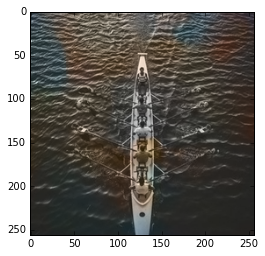

grayscale image


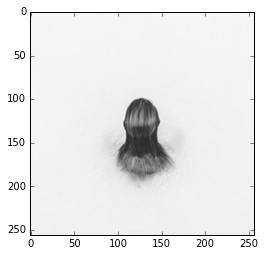

colorized image


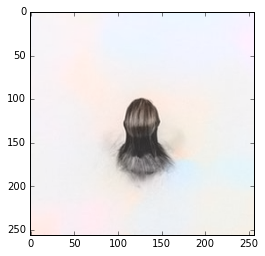

grayscale image


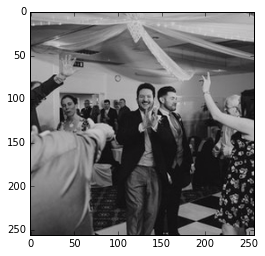

colorized image


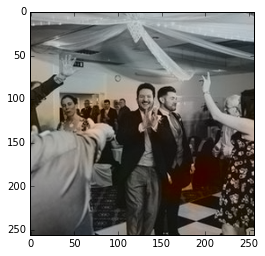

grayscale image


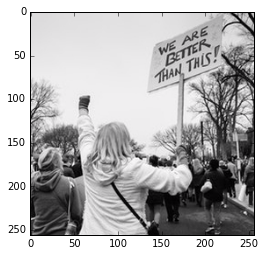

colorized image


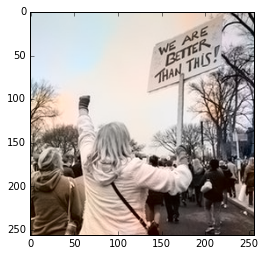

grayscale image


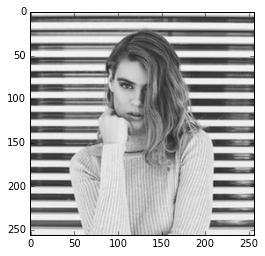

colorized image


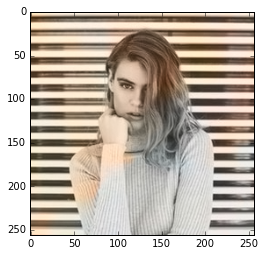

grayscale image


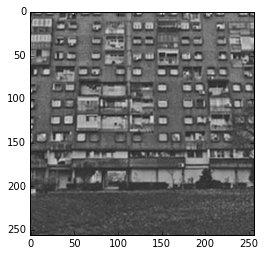

colorized image


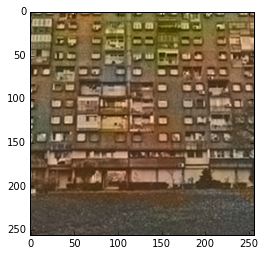

grayscale image


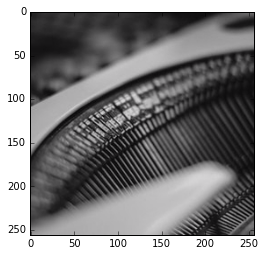

C:\Users\hp\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\color\colorconv.py:985: UserWarning: Color data out of range: Z < 0 in 2 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


colorized image


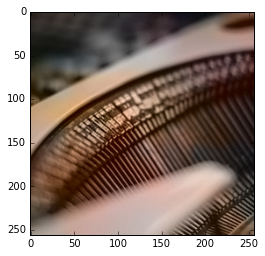

grayscale image


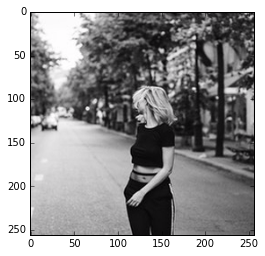

colorized image


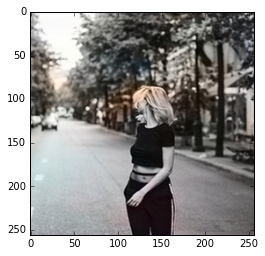

grayscale image


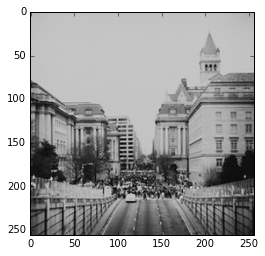

colorized image


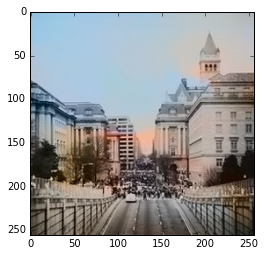

grayscale image


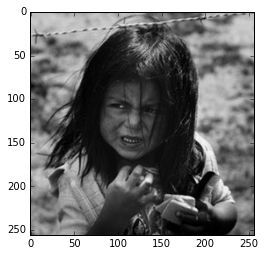

colorized image


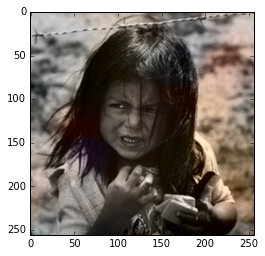

grayscale image


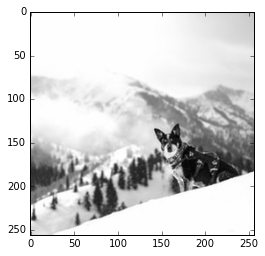

colorized image


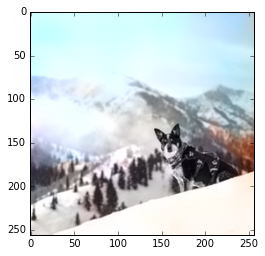

grayscale image


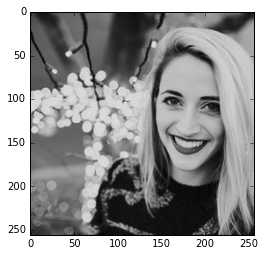

colorized image


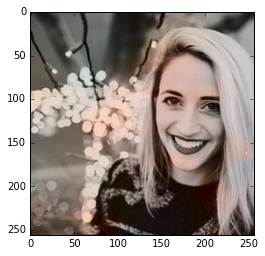

grayscale image


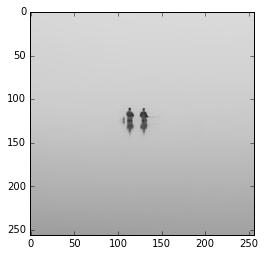

colorized image


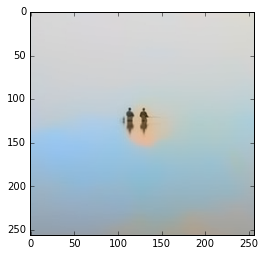

grayscale image


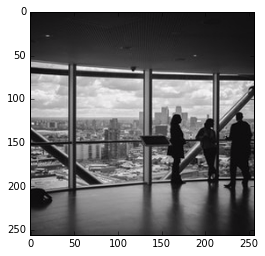

colorized image


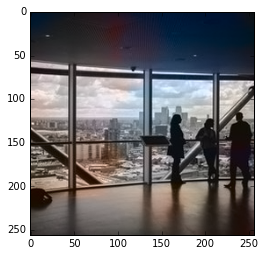

grayscale image


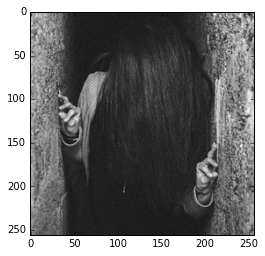

colorized image


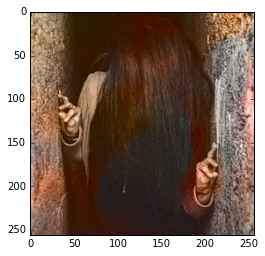

grayscale image


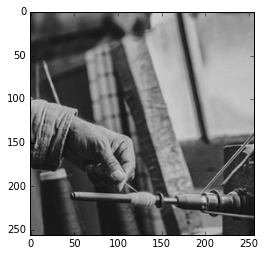

colorized image


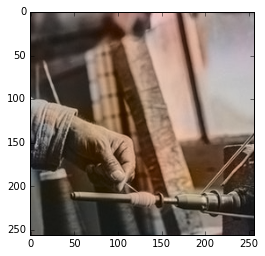

In [13]:
Xte = []
i= 0
for image in tfiles:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = color.rgb2lab(1.0/255*img)
    #img = color.rgb2lab(1.0/255*img)
    Xte.append(img)
Xte = np.array(Xte, dtype = float)
Xtest = Xte
xtt = Xtest[:,:,:,0]
ytt = Xtest[:,:,:,1:]
ytt = ytt/128
xtt = xtt.reshape(len(tfiles), 256, 256, 1)
for i in range(len(tfiles)):
    output = model.predict(xtt[i][:,:,0].reshape(1, 256, 256, 1))
    output = output*128
    pimage = np.zeros((256, 256, 3))
    pimage[:,:,0] = xtt[i][:,:,0]
    pimage = color.lab2rgb(pimage)
    print("grayscale image")
    plt.imshow(pimage)
    plt.show()
    pimage = np.zeros((256, 256, 3))
    pimage[:,:,0] = xtt[i][:,:,0]
    pimage[:,:,1:] = output[0]
    pimage = color.lab2rgb(pimage)
    print("colorized image")
    plt.imshow(pimage)
    plt.show()